# Dog Breed Identification
#### Practical Deep Learning Workshop 2021- Multi-Class Image Classification
Inbal Biton, Shachar Meretz



For this assigment we choose kaggle dataeset - Dog Breed Identification (https://www.kaggle.com/c/dog-breed-identification)
This dataset contains Dogs of different breeds pictures, and in this image classification project we will try to fit the breed to the dog in each picture


In [1]:
import pandas as pd
import numpy as np
import os
import cv2
import tensorflow as tf
from sklearn.model_selection import KFold, StratifiedKFold
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Input, Activation , AvgPool2D,MaxPool2D,Dropout , BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import shutil
import random
from tensorflow import keras
from  matplotlib import pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from numpy import expand_dims
from matplotlib import pyplot
from os import listdir
from os.path import isfile, join
from PIL import Image  
import csv
%matplotlib inline


# Exploratory data analysis of the dataset 

In [ ]:
train_set_images_size = {}

train_dir = r'C:\Users\shachar meretz\Downloads\dog-breed-identification\train\train'
train_set_size=len([name for name in os.listdir(train_dir) if os.path.isfile(os.path.join(train_dir, name))])

test_dir = r'C:\Users\shachar meretz\Downloads\dog-breed-identification\test\all_classes'
test_set_size=len([name for name in os.listdir(test_dir) if os.path.isfile(os.path.join(test_dir, name))])

print("Size Of Train Set : {}".format(train_set_size))
print("Size Of Test Set : {}".format(test_set_size))

# Get the dimenssions of each image from the test set
test_set_images_size = {}
test_dir = r'C:\Users\shachar meretz\Downloads\dog-breed-identification\test\all_classes'
for img in os.listdir(test_dir):
    image_path = os.path.join(test_dir,img)
    image = cv2.imread( image_path, cv2.COLOR_BGR2RGB)
    dim = '({},{},{})'.format(image.shape[0] , image.shape[1],image.shape[2])
    if dim in test_set_images_size:
        test_set_images_size[dim] = test_set_images_size[dim] + 1
    else:
        test_set_images_size[dim] = 1 

# Get the dimenssions of each image from the test set        
train_set_images_size = {}
for img in os.listdir(train_dir):
    image_path = os.path.join(train_dir,img)
    image = cv2.imread( image_path, cv2.COLOR_BGR2RGB)
    dim = '({},{},{})'.format(image.shape[0] , image.shape[1],image.shape[2])
    if dim in train_set_images_size:
        train_set_images_size[dim] = train_set_images_size[dim] + 1
    else:
        train_set_images_size[dim] = 1


Size Of Train Set : 10222
Size Of Test Set : 10357


# b.	What data does each sample contain?

In [ ]:
#Image Dimenssions Distribution - top 20
train_dims_df = pd.DataFrame(columns = ['dim' , 'values'])
test_dims_df = pd.DataFrame(columns = ['dim' , 'values'])

train_dims_df['dim'] = train_set_images_size.keys()
train_dims_df['values'] = train_set_images_size.values()

test_dims_df['dim'] = test_set_images_size.keys()
test_dims_df['values'] = test_set_images_size.values()

train_dims_df.sort_values('values' , inplace=True , ascending=False)
test_dims_df.sort_values('values' , inplace=True , ascending=False)


def Image_Dims_Distribution(df):
    fig, ax = plt.subplots(figsize =(16, 9)) 
  
    dims = df['dim'].head(20) 
    values = df['values'].head(20)
    ax.barh(dims, values , color="grey") 
  
    for s in ['top', 'bottom', 'left', 'right']: 
        ax.spines[s].set_visible(False) 
  
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none') 
  
    ax.xaxis.set_tick_params(pad = 5) 
    ax.yaxis.set_tick_params(pad = 10) 
  
    ax.grid(b = True, color ='grey', 
            linestyle ='-.', linewidth = 0.5, 
            alpha = 0.2) 
  
    ax.invert_yaxis() 
  
    for i in ax.patches: 
        plt.text(i.get_width()+0.2, i.get_y()+0.5,  
                 str(round((i.get_width()), 2)), 
                 fontsize = 18, fontweight ='bold', 
                 color ='grey'
                ) 
  
    plt.xlabel('Number Of Images', size = 30)
    plt.ylabel('Dimenssions', size = 30)
    plt.title('Image Dimenssions Distribution', size = 40)
    plt.xticks(size = 18 , color="maroon")
    plt.yticks(size = 18 , color="maroon")
    plt.show()

done


### Train Set Dimenssions Distribution: 

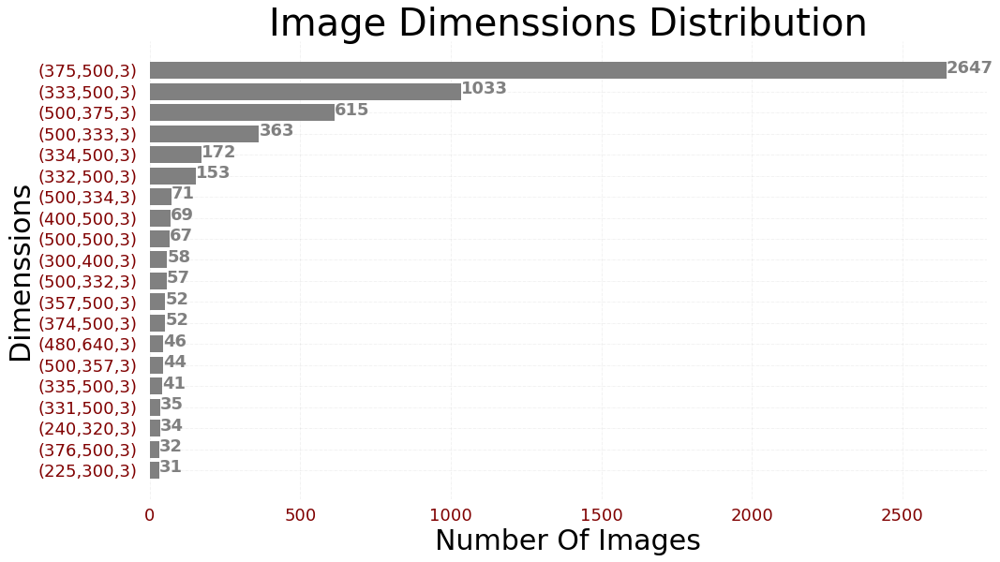

done


In [ ]:
Image_Dims_Distribution(train_dims_df)


### Train Set Dimenssions Distribution: 

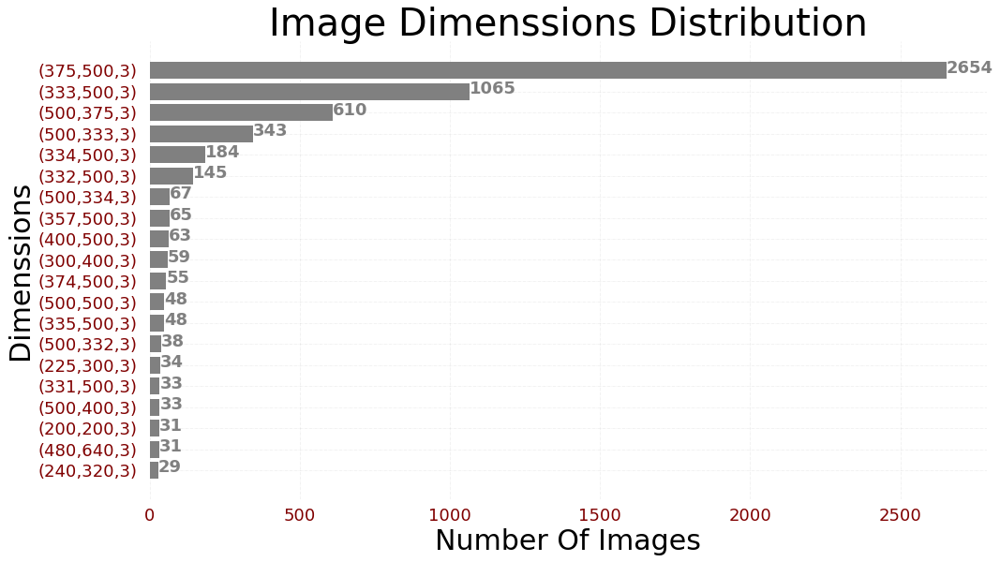

done


In [ ]:
Image_Dims_Distribution(test_dims_df)

### Histograsma of the label samples:


number of classes in the data set: 120


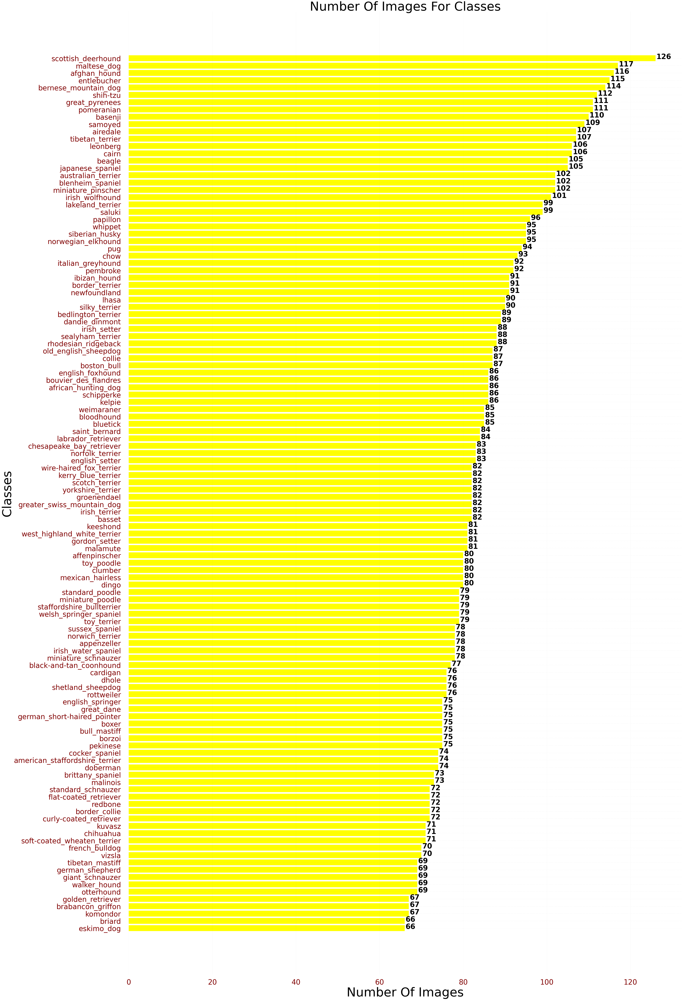

done


In [ ]:
# print histograsma of the labels samples
def Image_Lables_Distribution(df):
    fig, ax = plt.subplots(figsize =(56, 100)) 
  
    lables = df['breed'] 
    values = df['number of images']
    ax.barh(lables, values , color="grey" ) 
  
    for s in ['top', 'bottom', 'left', 'right']: 
        ax.spines[s].set_visible(False) 
  
    ax.xaxis.set_ticks_position('none') 
    ax.yaxis.set_ticks_position('none') 
  
    ax.xaxis.set_tick_params(pad = 20) 
    ax.yaxis.set_tick_params(pad = 40) 
  
    ax.grid(b = True, color ='grey', 
            linestyle ='-.', linewidth = 0.5, 
            alpha = 0.2) 
  
    ax.invert_yaxis() 
  
    for i in ax.patches: 
        plt.text(i.get_width()+0.2, i.get_y()+0.5,  
                 str(round((i.get_width()), 2)), 
                 fontsize = 40, fontweight ='bold', 
                 color ='black')

    plt.xlabel('Number Of Images', size = 70)
    plt.ylabel('Classes', size = 70)
    plt.title('Number Of Images For Classes', size = 70)
    plt.xticks(size = 40 , color="maroon")
    plt.yticks(size = 40 , color="maroon")
    plt.show()

lables_df = pd.read_csv(r'C:\Users\shachar meretz\Downloads\dog-breed-identification\labels.csv' , engine="python")
images_by_lable = pd.DataFrame()
images_by_lable['number of images'] = lables_df.groupby('breed').size()
images_by_lable.sort_values('number of images' , inplace=True , ascending=False)
images_by_lable.reset_index(inplace=True)
print("number of classes in the data set: " + str(len(images_by_lable.index)))
Image_Lables_Distribution(images_by_lable)

### Number of benchmarks that we found in Kaggle Competitions regarding to our Data set Of Dog-Breed-Identification :

1.  VGGNet 19 : 
    Accuracy: 83%
    Log Loss: 0.56 

2. Inception V3: 
    Accuracy: 87%
    Log Loss: 0.47

3. ResNet50: 
    Accuracy: 90%
    Log Loss: 0.38

4. Xception: 
    Accuracy: 89%
    Log Loss: 0.42

5. DenseNet:
    Accuracy: 91%
    Log Loss: 0.36

6. SENet:
    Accuracy: 89%
    Log Loss: 0.38

7. ResNext:
    Accuracy: 93%
    Log Loss: 0.22

8. InceptionV4:
    Accuracy: 94%
    Log Loss: 0.20

9. InceptionResnetV2:
    Accuracy: 95%
    Log Loss: 0.19

10. Ensembling InceptionResNetV2, InceptionV4 and ResNext:
    Accuracy: 96%
    Log Loss: 0.16
                   
In addition , the suggestion input size is (299-400,299-400).

Values of Log Loss that other models get:
(acquired through 5 fold cv, between folds score might very from less than 0.17 to 0.26):

1. inception_4_300 - 0.228

2. inception_4_350 - 0.211

3. inception_4_400 - 0.204

4. inception_4_450 - 0.223

5. inceptionresnet_2_300 - 0.239

6. inceptionresnet_2_350 - 0.217

7. inceptionresnet_2_400 - 0.215

8. inceptionresnet_2_450 - 0.222


### How our Data Set look like:

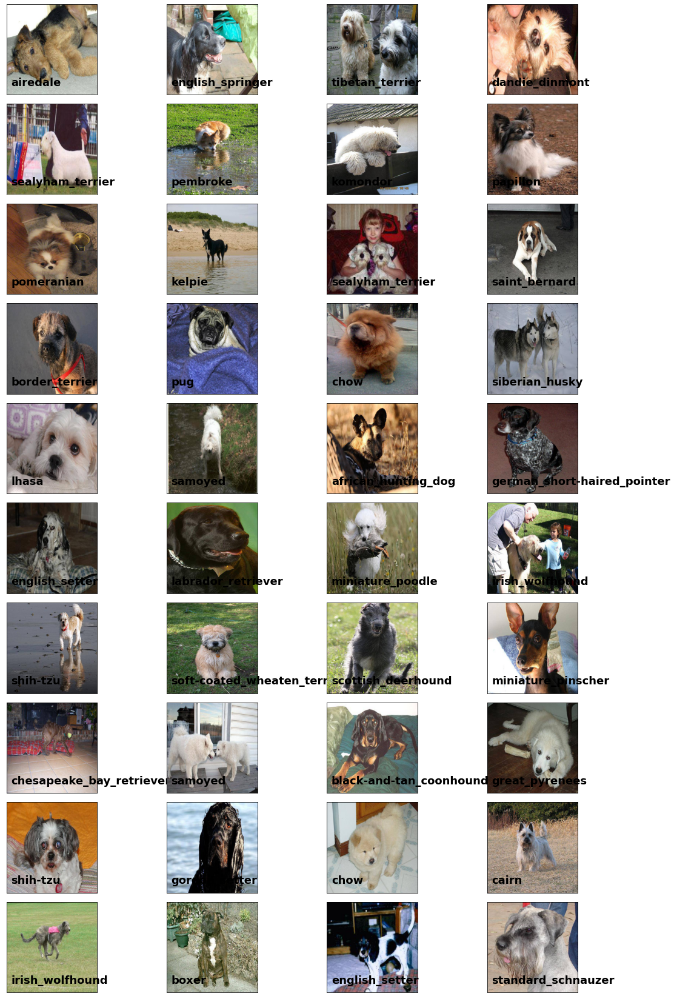

In [ ]:
train_dir = r'/content/drive/MyDrive/Data/train'
def Display_Images(data_set,data_set_lables,nrow=2,ncol=2,figsize=(20,20),preds=None):
    fig,ax = plt.subplots(nrows=nrow,ncols=ncol,figsize=figsize)
    fig.subplots_adjust(hspace=0.1, wspace=-0.7)
    for i in range(nrow*ncol):
        ax[i//ncol,i%ncol].imshow(data_set[i],cmap='binary')
        ax[i//ncol,i%ncol].set_xticks([])
        ax[i//ncol,i%ncol].set_yticks([])
        if preds is not None:
            ax[i//ncol,i%ncol].text(0.85, 0.1, str(preds[i]), transform=ax[i//ncol,i%ncol].transAxes,
                                   color='green' if data_set_lables[i]==preds[i] else 'red',weight='bold')
            ax[i//ncol,i%ncol].text(0.05, 0.1, str(data_set_lables[i]) + '\n', color='yellow',transform=ax[i//ncol,i%ncol].transAxes,weight='bold')
        else:
            ax[i//ncol,i%ncol].text(0.05, 0.1, str(data_set_lables[i]), color='black',transform=ax[i//ncol,i%ncol].transAxes,weight='bold' , fontsize=18)
    plt.show()

    
img_data_array=[]
image_names=[]
for i in range(40):
    file = random.choice(os.listdir(train_dir))
    image_names.append(file.split('.')[0])
    image_path= os.path.join(train_dir,file)
    image=load_img( image_path)
    image=image.resize((400, 400))
    image=np.array(image)
    image=image.astype('float32')
    image /= 255 
    img_data_array.append(image)
    
lables_df = pd.read_csv(r'/content/drive/MyDrive/Data/labels.csv' , engine="python")
lables_df.set_index('id' , inplace=True)
data_set_lables=[]
for name in image_names:
    lbl = lables_df.loc[name , 'breed']
    data_set_lables.append(lbl)
Display_Images(img_data_array,data_set_lables,10,4,(30,30))





# Challenges :
as we can see, there are a lot of pictures that we can assume will be challenges for our model.
pictures with another animal (like sheep or cat) , pictures with 2 diffrents dogs , picture with people and picture with a lot of background noise(like super marker or nature)

In [ ]:
# General function to diaply grid of images
def plot_grid_of_images(images , rows , cols , wspace , hspace ,lables=None):
    fig,ax=plt.subplots(rows,cols, figsize=(20,20))
    fig.subplots_adjust(hspace=hspace, wspace=wspace)
    for i in range(cols*rows):
        if(cols>1 and rows>1):
            r = i//cols
            c = i%cols
            if(i<len(images)):
                image=load_img(images[i])
                image=image.resize((400, 400))
                ax[r,c].imshow(image)
                ax[r,c].set_xticks([])
                ax[r,c].set_yticks([])
                if lables is not None:
                    ax[r,c].text(0.05, 0.1, str(lables[i]), color='black',transform=ax[r,c].transAxes,weight='bold' , fontsize=18)
        else:
            r = i
            c = i
            if(i<len(images)):
                image=load_img(images[i])
                image=image.resize((400, 400))
                ax[r].imshow(image)
                ax[r].set_xticks([])
                ax[r].set_yticks([])
                if lables is not None:
                    ax[r,c].text(0.05, 0.1, str(lables[i]), color='black',transform=ax[r,c].transAxes,weight='bold' , fontsize=18)
    plt.show()

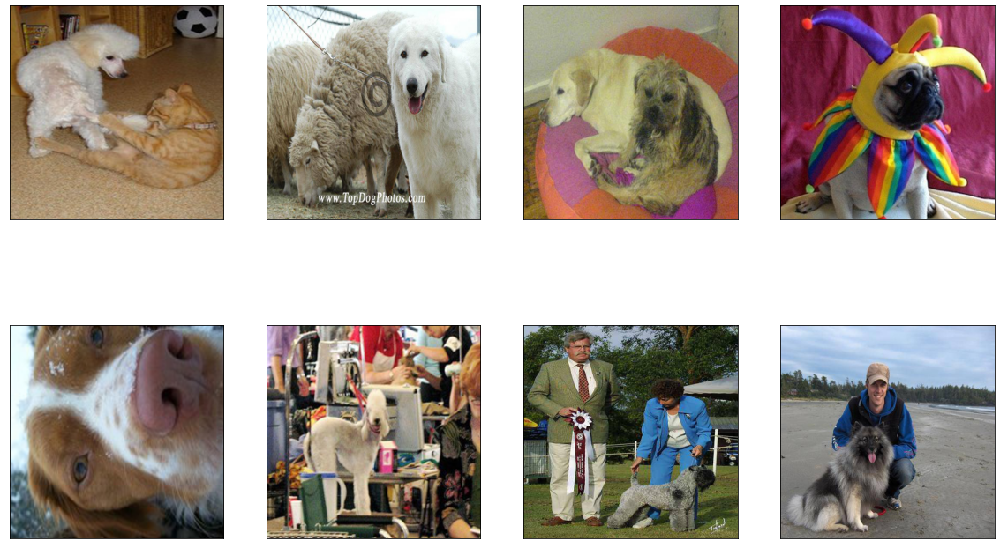

In [ ]:
mypath=r'C:\Users\shachar meretz\Downloads\dog-breed-identification\new'
onlyfiles = [os.path.join(mypath,f) for f in listdir(mypath) if isfile(join(mypath, f))]
plot_grid_of_images(onlyfiles , 2 ,4 , 0.2 , -0.5)

# possible missclasify:
AS we can see, there are some dog breeds that are similar to others. 
we assume that our model can easily missclassify them 

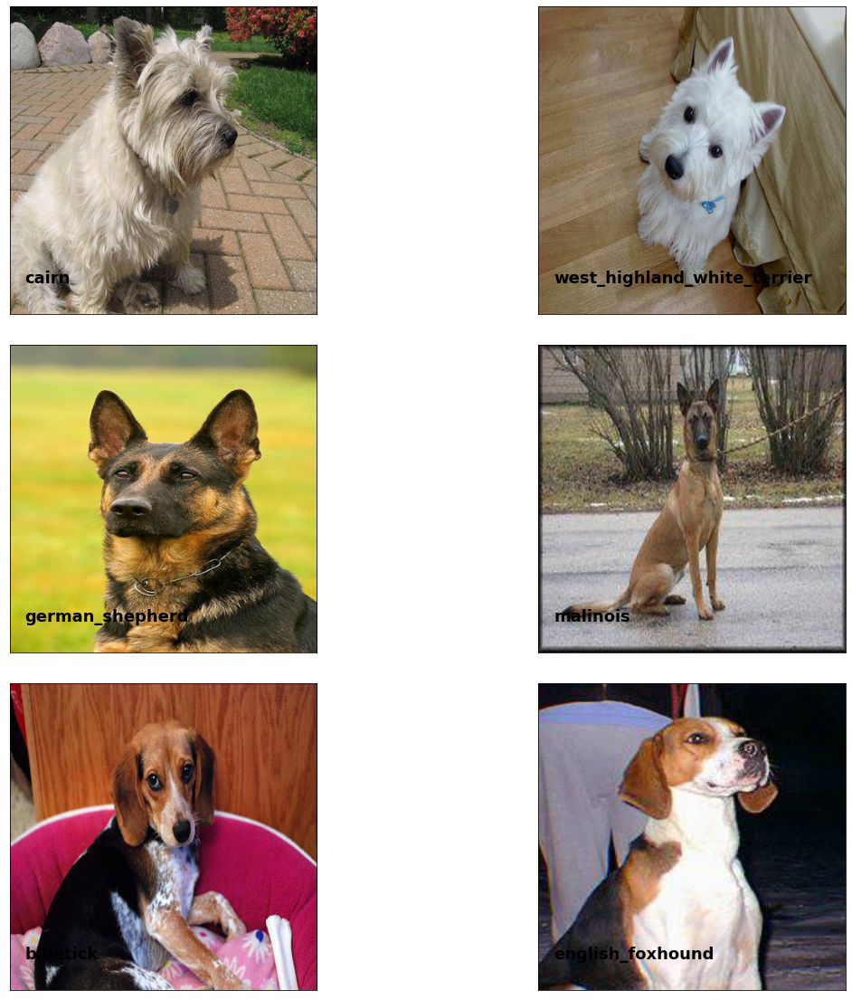

In [ ]:
mypath=r'C:\Users\shachar meretz\Downloads\dog-breed-identification\missclasify'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
i=0
lables_df = pd.read_csv(r'C:\Users\shachar meretz\Downloads\dog-breed-identification\labelsMissClass.csv' , engine="python")
lables_df=lables_df[0:6]
lables = []
for file in onlyfiles:
    lbl=lables_df.loc[lables_df['id'] == file, 'breed'].iloc[0]
    lables.append(lbl)

onlyfiles=[os.path.join(mypath,f) for f in onlyfiles]   
plot_grid_of_images(onlyfiles , 3 ,2 , 0.1 , 0.1 , lables)    
    

# easy clasify:

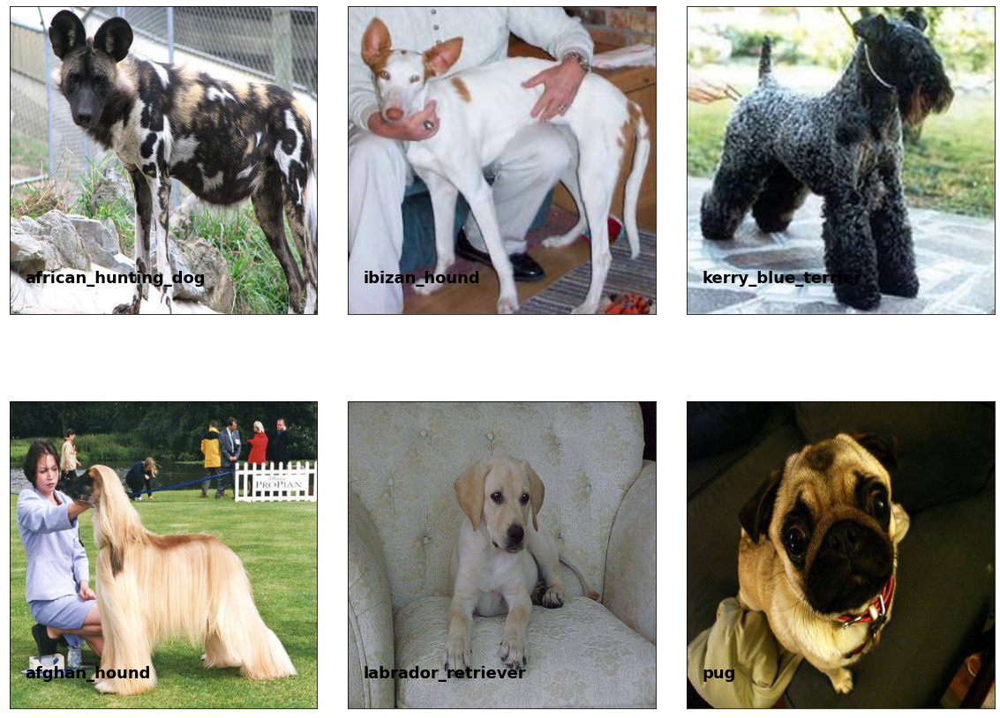

In [ ]:
mypath=r'C:\Users\shachar meretz\Downloads\dog-breed-identification\easy classify'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
lables_df = pd.read_csv(r'C:\Users\shachar meretz\Downloads\dog-breed-identification\labelsEasyClass.csv' , engine="python")
lables_df=lables_df[0:7]
lables = []

for file in onlyfiles:
    lbl=lables_df.loc[lables_df['id'] == file, 'breed'].iloc[0]
    lables.append(lbl)
    
onlyfiles=[os.path.join(mypath,f) for f in onlyfiles]  
plot_grid_of_images(onlyfiles , 2 ,3 , 0.1 , -0.3 , lables) 


## Example for augmantation:

1. Geometric transformations 
2. flipping
3. cropping
4. rotation


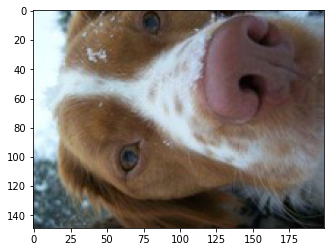

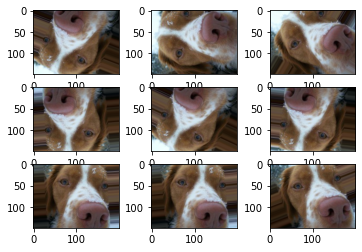

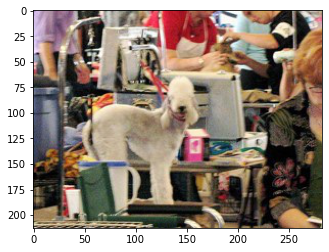

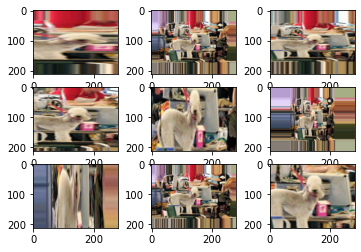

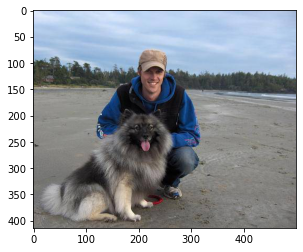

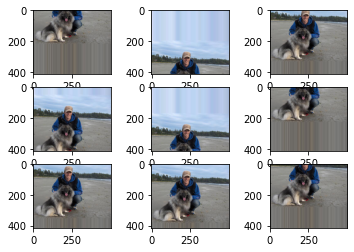

In [ ]:
img = load_img(r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\examples\a.jpeg')
pyplot.imshow(img)
pyplot.show()

data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(rotation_range=100)
it = datagen.flow(samples, batch_size=1)
for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
pyplot.show()

img = load_img(r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\examples\b.jpeg')
pyplot.imshow(img)
pyplot.show()

data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(zoom_range=1)
it = datagen.flow(samples, batch_size=1)
for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
pyplot.show()


img = load_img(r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\examples\d.jpeg')
pyplot.imshow(img)
pyplot.show()

data = img_to_array(img)
samples = expand_dims(data, 0)
datagen = ImageDataGenerator(height_shift_range=200)
it = datagen.flow(samples, batch_size=1)
for i in range(9):
    pyplot.subplot(330 + 1 + i)
    batch = it.next()
    image = batch[0].astype('uint8')
    pyplot.imshow(image)
pyplot.show()


# Build NN model:
Forming a nueral network and use 5Fold cross validation to measure model performance.
this fit model function create 5Fold cross validation and fit the weights models with the data.
Moreover, this fit model use for each fold 30 epochs and use callbacks for eralyStopping (if the model val accuracy didn't upgrade fot 10 epochs) and save best weights.
at the end , it display the accuracy and loss of each fold.

### Fit model:

In [17]:
breeds_df = pd.read_csv(r'/content/drive/MyDrive/Data/sample_submission.csv' , engine="python")
breed_names = breeds_df.columns[1:121]

def Model_Name(round):
    return "Model_{}.h5".format(round)

def fit_model_5Fold(num_of_model,input_size,augmentation=False):
    main_dir = r"/content/drive/MyDrive/Data/"
    save_dir = r"/content/drive/MyDrive/Data/Models/" 
    lables_df = pd.read_csv("/content/drive/MyDrive/Data/labels.csv" , engine="python")

    train_df = lables_df[['breed']]
    train_df['id'] = lables_df['id'] + '.jpg'
    Y = train_df[['breed']]

    kfold_model = KFold(n_splits=5)
    stratified_kfold = StratifiedKFold(n_splits=5 , shuffle = True , random_state = 4)
    
    datagen=None
    if augmentation:
        datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=40,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest'
            ) 
    else:
        datagen = ImageDataGenerator()
    
    round_kfold = 1
    VALIDATION_ACCURACY = []
    VALIDAITON_LOSS = []
    for train_index, val_index in kfold_model.split(np.zeros(len(Y)),Y):
        print("Start FOLD Number {}".format(round_kfold))
        training_data = train_df.iloc[train_index]
        validation_data = train_df.iloc[val_index]

        train_data_generator = datagen.flow_from_dataframe(training_data, directory=os.path.join(main_dir,'train'),
                                    x_col = "id", y_col = "breed",
                                    target_size=input_size,
                                    color_mode="rgb", 
                                    batch_size=32,
                                    class_mode = "categorical", shuffle = True)
        valid_data_generator = datagen.flow_from_dataframe(validation_data, directory=os.path.join(main_dir,'train'),
                                   x_col = "id", y_col = "breed",
                                    target_size=input_size,
                                    color_mode="rgb", 
                                    batch_size=32,
                                   class_mode = "categorical", shuffle = True)

        cp =tf.keras.callbacks.ModelCheckpoint(os.path.join(save_dir,Model_Name(round_kfold)), monitor='val_accuracy', 
                            verbose=1, save_best_only=True, mode='max')
        es = tf.keras.callbacks.EarlyStopping(patience=10,monitor='val_accuracy')
        callbacks_list=[cp,es]
        
        if num_of_model==1:
            model=Get_first_model()
        elif num_of_model==2:
            model=get_Second_Model()
        elif num_of_model==3:
            model=get_third_model()
        else:
            model=get_model_for_augmentation()

        if round_kfold==1:
            model.summary()

        model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

        history = model.fit(train_data_generator, epochs=30, callbacks=callbacks_list,validation_data=valid_data_generator)

        fig, ax = plt.subplots(1,2,figsize=(12,4))
        ax[0].plot(history.history['accuracy'] , color='red')
        ax[0].plot(history.history['val_accuracy'] , color='green')
        ax[0].set_title('Model Accuracy')
        ax[0].set_ylabel('Accuracy')
        ax[0].set_xlabel('Epoch')
        ax[0].legend(['Train', 'Validation'], loc='upper left' )

        ax[1].plot(history.history['loss'] , color='red')
        ax[1].plot(history.history['val_loss'] , color='green')
        ax[1].set_title('Model Loss')
        ax[1].set_ylabel('Loss')
        ax[1].set_xlabel('Epoch')
        ax[1].legend(['Train', 'Validation'], loc='upper left')
        plt.show()
        plt.savefig('fold{}.png'.format(round_kfold))

        model.load_weights(save_dir + Model_Name(round_kfold))
        results = model.evaluate(valid_data_generator)
        results = dict(zip(model.metrics_names,results))
        VALIDATION_ACCURACY.append(results['accuracy'])
        VALIDAITON_LOSS.append(results['loss'])
        tf.keras.backend.clear_session()

        round_kfold += 1
    index = 0
    min_loss = np.min(VALIDAITON_LOSS)
    for i in range(5):
        if VALIDAITON_LOSS[i] == min_loss:
            index = i
            break
    model.load_weights(save_dir + Model_Name(index+1))
    return model


### First model:

The basic model. 
the Input shape of this model is picture of 375X375X3
this model contain 2 blocks that each block contain convolutaion layer, MaxPool layer and DropOut layer.
at the end of those 2 blocks, the model has the flatten layers.
The output layer is Dense layer with "softmax" activation function and 120 kernel that represent 120 diffrent dog breeds.

In [ ]:
def Get_first_model():
    first_model = Sequential()
    first_model.add(Conv2D(32, (3, 3),activation='relu' , input_shape=(375, 375, 3)))
    first_model.add(MaxPool2D(pool_size=(2, 2)))
    first_model.add(Dropout(0.2))
    first_model.add(Conv2D(64, (3, 3),activation='relu'))
    first_model.add(MaxPool2D(pool_size=(2, 2)))
    first_model.add(Dropout(0.2))
    first_model.add(Flatten())
    first_model.add(Dense(120,activation='softmax'))
    return first_model

Start FOLD Number 1
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 373, 373, 32)      896       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 186, 186, 32)      0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 186, 186, 32)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 184, 184, 64)      18496     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 92, 92, 64)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 92, 

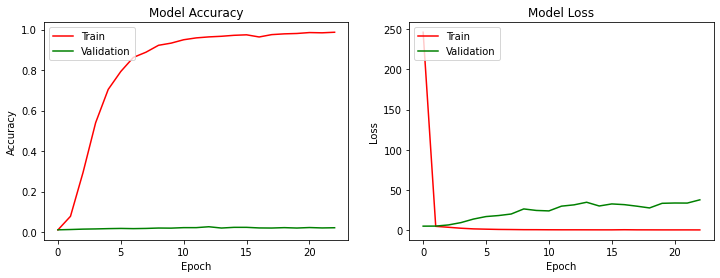

64/64 [==============================] - 12s 180ms/step - loss: 31.3156 - accuracy: 0.0259
Start FOLD Number 2
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 288.7956 - accuracy: 0.0119
Epoch 00001: val_accuracy improved from -inf to 0.00831, saving model to /content/drive/MyDrive/dog breed/Models/Model_2.h5
256/256 [==============================] - 70s 271ms/step - loss: 288.7956 - accuracy: 0.0119 - val_loss: 4.7860 - val_accuracy: 0.0083
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 4.7611 - accuracy: 0.0235
Epoch 00002: val_accuracy improved from 0.00831 to 0.01271, saving model to /content/drive/MyDrive/dog breed/Models/Model_2.h5
256/256 [==============================] - 70s 275ms/step - loss: 4.7611 - accuracy: 0.0235 - val_loss: 4.8509 - val_accuracy: 0.0127
Epoch 3/30
256/256 [============================

<Figure size 432x288 with 0 Axes>

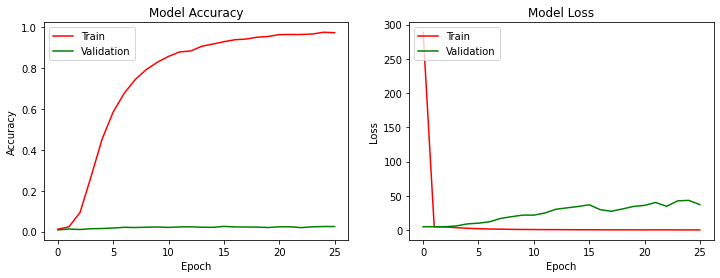

64/64 [==============================] - 12s 180ms/step - loss: 36.8796 - accuracy: 0.0254
Start FOLD Number 3
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 243.3239 - accuracy: 0.0115
Epoch 00001: val_accuracy improved from -inf to 0.00832, saving model to /content/drive/MyDrive/dog breed/Models/Model_3.h5
256/256 [==============================] - 69s 270ms/step - loss: 243.3239 - accuracy: 0.0115 - val_loss: 4.7857 - val_accuracy: 0.0083
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 4.6712 - accuracy: 0.0479
Epoch 00002: val_accuracy improved from 0.00832 to 0.01125, saving model to /content/drive/MyDrive/dog breed/Models/Model_3.h5
256/256 [==============================] - 71s 277ms/step - loss: 4.6712 - accuracy: 0.0479 - val_loss: 4.7962 - val_accuracy: 0.0113
Epoch 3/30
256/256 [============================

<Figure size 432x288 with 0 Axes>

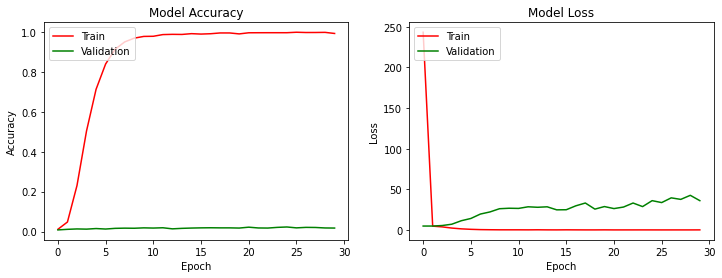

64/64 [==============================] - 12s 184ms/step - loss: 36.0430 - accuracy: 0.0230
Start FOLD Number 4
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 492.9103 - accuracy: 0.0114
Epoch 00001: val_accuracy improved from -inf to 0.01223, saving model to /content/drive/MyDrive/dog breed/Models/Model_4.h5
256/256 [==============================] - 69s 270ms/step - loss: 492.9103 - accuracy: 0.0114 - val_loss: 4.7859 - val_accuracy: 0.0122
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 4.6893 - accuracy: 0.0466
Epoch 00002: val_accuracy improved from 0.01223 to 0.01272, saving model to /content/drive/MyDrive/dog breed/Models/Model_4.h5
256/256 [==============================] - 70s 275ms/step - loss: 4.6893 - accuracy: 0.0466 - val_loss: 4.7990 - val_accuracy: 0.0127
Epoch 3/30
256/256 [============================

<Figure size 432x288 with 0 Axes>

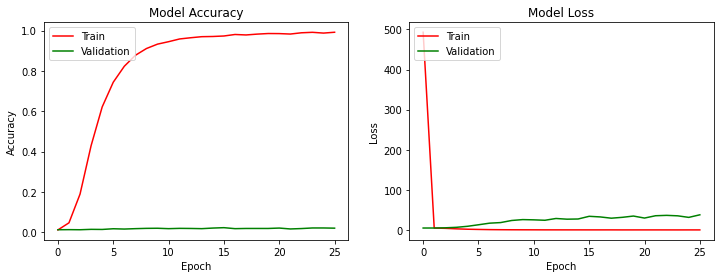

64/64 [==============================] - 12s 183ms/step - loss: 34.0040 - accuracy: 0.0225
Start FOLD Number 5
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 331.5820 - accuracy: 0.0101
Epoch 00001: val_accuracy improved from -inf to 0.01272, saving model to /content/drive/MyDrive/dog breed/Models/Model_5.h5
256/256 [==============================] - 69s 268ms/step - loss: 331.5820 - accuracy: 0.0101 - val_loss: 4.7860 - val_accuracy: 0.0127
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 4.5660 - accuracy: 0.0685
Epoch 00002: val_accuracy improved from 0.01272 to 0.01321, saving model to /content/drive/MyDrive/dog breed/Models/Model_5.h5
256/256 [==============================] - 70s 275ms/step - loss: 4.5660 - accuracy: 0.0685 - val_loss: 4.8731 - val_accuracy: 0.0132
Epoch 3/30
256/256 [============================

<Figure size 432x288 with 0 Axes>

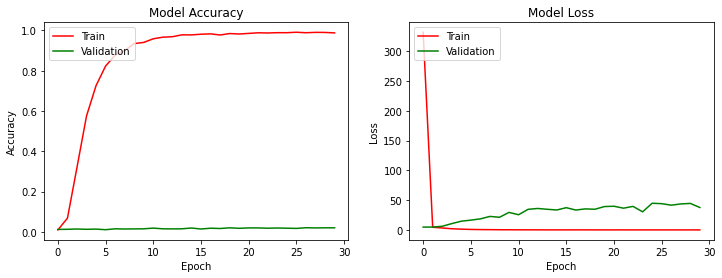

64/64 [==============================] - 12s 190ms/step - loss: 41.5699 - accuracy: 0.0210
0


<Figure size 432x288 with 0 Axes>

In [ ]:
first_model= fit_model_5Fold(1 , (375,375))

### First improvment:

By the result from the first model we see that the accuracy and loss is low and high respectively , and we have overfitting.

As we learned in the lectures there are several ways to improve the model of a neural network:

we learned that we can use convolution layers, add Batch normalizing layers to optimize learning time and reach convergence faster, and in addition we can use drop out and pooling layers that are not learning layers and are not add parameters to the model.

We decided to improve the model by adding convolution layers containing number of filters in ascending order - this will allow us to create more depth to the image - create more features for the Flatten layer and reduce the image dimensions.

we also add a Batch normalization layer at the end of the convolutaion calculate - this layer will improve the learning speed of the model and make the process more stable.

To get better generalize of our model, we decided to increase the drop-out value in order to randomly remove more values and generalize the image, and reduce the dimensions of the input images to 300x300.

### Second model:

In [ ]:
def get_Second_Model():
    second_model = Sequential()
    second_model.add(Conv2D(32, (3, 3),activation='relu' , input_shape=(300, 300, 3)))
    second_model.add(MaxPool2D(pool_size=(2, 2)))
    second_model.add(Dropout(0.5))
    second_model.add(Conv2D(64, (3, 3),activation='relu'))
    second_model.add(MaxPool2D(pool_size=(2, 2)))
    second_model.add(Dropout(0.5))
    second_model.add(Conv2D(128, (3, 3),activation='relu' ))
    second_model.add(MaxPool2D(pool_size=(2, 2)))
    second_model.add(Dropout(0.5))
    second_model.add(Conv2D(512, (3, 3),activation='relu' ))
    second_model.add(MaxPool2D(pool_size=(2, 2)))
    second_model.add(Dropout(0.5))
    second_model.add(BatchNormalization())
    second_model.add(Dropout(0.5))
    second_model.add(Flatten())
    second_model.add(Dense(120,activation='softmax'))
    return second_model

Start FOLD Number 1
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 149, 149, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 73, 73

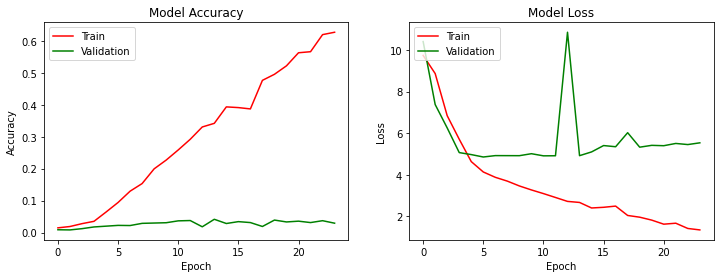

64/64 [==============================] - 10s 159ms/step - loss: 4.9190 - accuracy: 0.0416
Start FOLD Number 2
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 10.0974 - accuracy: 0.0149
Epoch 00001: val_accuracy improved from -inf to 0.00978, saving model to /content/drive/MyDrive/dog breed/Models/Model_2.h5
256/256 [==============================] - 59s 232ms/step - loss: 10.0974 - accuracy: 0.0149 - val_loss: 10.4829 - val_accuracy: 0.0098
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 9.5772 - accuracy: 0.0172
Epoch 00002: val_accuracy improved from 0.00978 to 0.01320, saving model to /content/drive/MyDrive/dog breed/Models/Model_2.h5
256/256 [==============================] - 60s 234ms/step - loss: 9.5772 - accuracy: 0.0172 - val_loss: 7.5242 - val_accuracy: 0.0132
Epoch 3/30
256/256 [==============================

<Figure size 432x288 with 0 Axes>

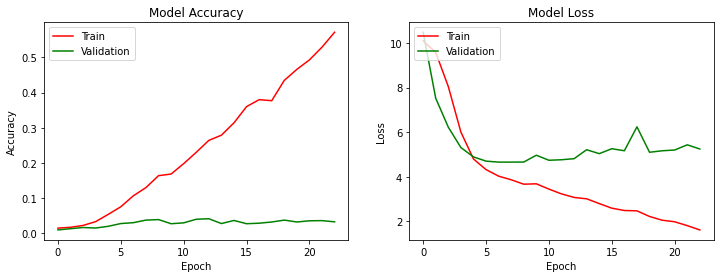

64/64 [==============================] - 10s 159ms/step - loss: 4.8123 - accuracy: 0.0416
Start FOLD Number 3
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 9.7583 - accuracy: 0.0149
Epoch 00001: val_accuracy improved from -inf to 0.00489, saving model to /content/drive/MyDrive/dog breed/Models/Model_3.h5
256/256 [==============================] - 63s 245ms/step - loss: 9.7583 - accuracy: 0.0149 - val_loss: 9.4113 - val_accuracy: 0.0049
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 9.0302 - accuracy: 0.0181
Epoch 00002: val_accuracy improved from 0.00489 to 0.00636, saving model to /content/drive/MyDrive/dog breed/Models/Model_3.h5
256/256 [==============================] - 60s 236ms/step - loss: 9.0302 - accuracy: 0.0181 - val_loss: 7.9017 - val_accuracy: 0.0064
Epoch 3/30
256/256 [==============================] -

<Figure size 432x288 with 0 Axes>

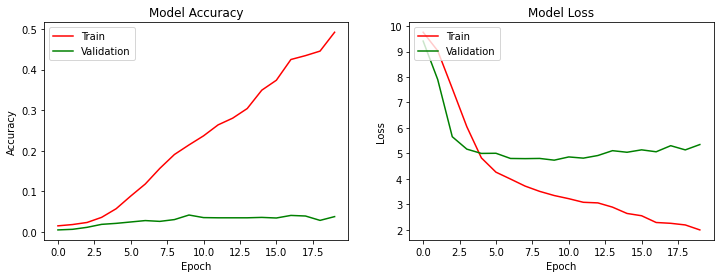

64/64 [==============================] - 10s 162ms/step - loss: 4.7341 - accuracy: 0.0416
Start FOLD Number 4
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 9.3396 - accuracy: 0.0139
Epoch 00001: val_accuracy improved from -inf to 0.00783, saving model to /content/drive/MyDrive/dog breed/Models/Model_4.h5
256/256 [==============================] - 60s 235ms/step - loss: 9.3396 - accuracy: 0.0139 - val_loss: 9.0847 - val_accuracy: 0.0078
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 8.2806 - accuracy: 0.0201
Epoch 00002: val_accuracy improved from 0.00783 to 0.01125, saving model to /content/drive/MyDrive/dog breed/Models/Model_4.h5
256/256 [==============================] - 60s 236ms/step - loss: 8.2806 - accuracy: 0.0201 - val_loss: 7.0260 - val_accuracy: 0.0113
Epoch 3/30
256/256 [==============================] -

<Figure size 432x288 with 0 Axes>

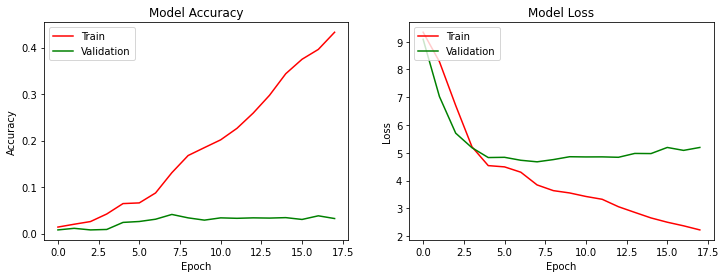

64/64 [==============================] - 10s 162ms/step - loss: 4.6756 - accuracy: 0.0411
Start FOLD Number 5
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 9.9170 - accuracy: 0.0135
Epoch 00001: val_accuracy improved from -inf to 0.01321, saving model to /content/drive/MyDrive/dog breed/Models/Model_5.h5
256/256 [==============================] - 60s 233ms/step - loss: 9.9170 - accuracy: 0.0135 - val_loss: 7.8691 - val_accuracy: 0.0132
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 9.0136 - accuracy: 0.0191
Epoch 00002: val_accuracy did not improve from 0.01321
256/256 [==============================] - 60s 234ms/step - loss: 9.0136 - accuracy: 0.0191 - val_loss: 7.3210 - val_accuracy: 0.0098
Epoch 3/30
256/256 [==============================] - ETA: 0s - loss: 7.2822 - accuracy: 0.0258
Epoch 00003: val_accuracy did

<Figure size 432x288 with 0 Axes>

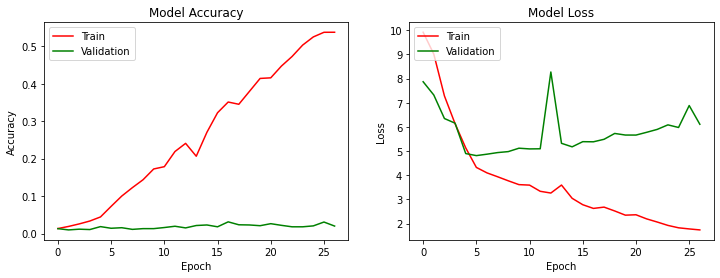

64/64 [==============================] - 11s 172ms/step


AttributeError: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
second_model= fit_model_5Fold(2,(300,300))


### Second improvment:

By the result from the second model we see that the accuracy and loss is low and high respectively again, but the overfitting increade gradually and not all at once.

In the second improvement we decided to add more convolution layers with a larger number of filters in order to get more depth and more features. 
In addition we added a layer of Batch Normalization after each layer of convolution and after each layer of Dense - i.e. after each layer performing a particular calculation. 

More than that, after the Flatten layer we decided to perform several Dense layers in order to gradually reduce the number of features we will get in each layer and in this way we will have the significant features to perform the classification.

In [16]:
def get_third_model():
    model = Sequential()

    model.add(Conv2D(32, (3, 3),activation='relu', input_shape=(300,300,3)))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(64, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(128, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(512, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(1024, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(2048, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(120, activation='softmax'))
    model.summary()
    return model


Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization_28 (Batc (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d_26 (MaxPooling (None, 49, 49, 32)        0         
_________________________________________________________________
dropout_28 (Dropout)         (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
batch_normalization_29 (Batc (None, 47, 47, 64)        256       
_________________________________________________________________
max_pooling2d_27 (MaxPooling (None, 23, 23, 64)       

Start FOLD Number 1
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 298, 298, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 32)      0         
_________________________________________________________________
dropout (Dropout)            (None, 149, 149, 32)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 64)      18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 147, 1

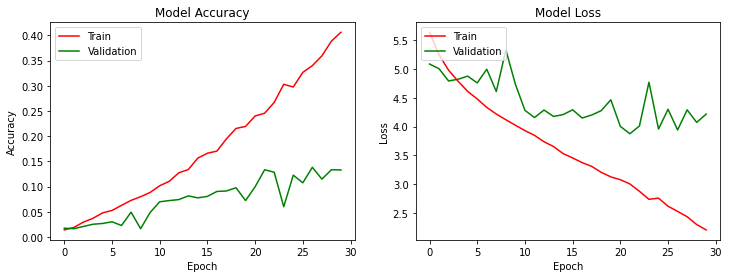

64/64 [==============================] - 10s 162ms/step - loss: 3.9413 - accuracy: 0.1384
Start FOLD Number 2
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 5.6621 - accuracy: 0.0108
Epoch 00001: val_accuracy improved from -inf to 0.01320, saving model to /content/drive/MyDrive/Data/Models/Model_2.h5
256/256 [==============================] - 67s 261ms/step - loss: 5.6621 - accuracy: 0.0108 - val_loss: 5.3949 - val_accuracy: 0.0132
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 5.2262 - accuracy: 0.0204
Epoch 00002: val_accuracy improved from 0.01320 to 0.02543, saving model to /content/drive/MyDrive/Data/Models/Model_2.h5
256/256 [==============================] - 68s 264ms/step - loss: 5.2262 - accuracy: 0.0204 - val_loss: 4.7207 - val_accuracy: 0.0254
Epoch 3/30
256/256 [==============================] - ETA: 0s -

<Figure size 432x288 with 0 Axes>

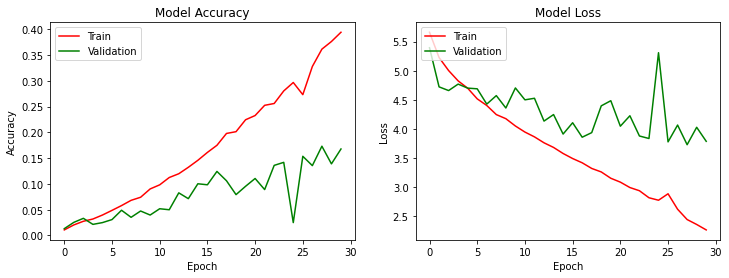

64/64 [==============================] - 10s 160ms/step - loss: 3.7242 - accuracy: 0.1731
Start FOLD Number 3
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 5.6988 - accuracy: 0.0131
Epoch 00001: val_accuracy improved from -inf to 0.01566, saving model to /content/drive/MyDrive/Data/Models/Model_3.h5
256/256 [==============================] - 69s 268ms/step - loss: 5.6988 - accuracy: 0.0131 - val_loss: 5.5091 - val_accuracy: 0.0157
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 5.2285 - accuracy: 0.0224
Epoch 00002: val_accuracy improved from 0.01566 to 0.02202, saving model to /content/drive/MyDrive/Data/Models/Model_3.h5
256/256 [==============================] - 67s 262ms/step - loss: 5.2285 - accuracy: 0.0224 - val_loss: 5.0477 - val_accuracy: 0.0220
Epoch 3/30
256/256 [==============================] - ETA: 0s -

<Figure size 432x288 with 0 Axes>

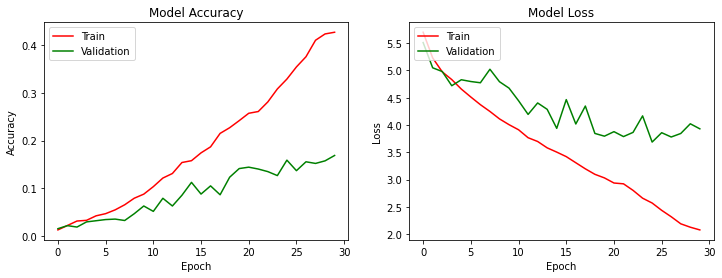

64/64 [==============================] - 11s 177ms/step - loss: 3.9304 - accuracy: 0.1688
Start FOLD Number 4
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 5.6829 - accuracy: 0.0133
Epoch 00001: val_accuracy improved from -inf to 0.01272, saving model to /content/drive/MyDrive/Data/Models/Model_4.h5
256/256 [==============================] - 67s 262ms/step - loss: 5.6829 - accuracy: 0.0133 - val_loss: 5.2944 - val_accuracy: 0.0127
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 5.2283 - accuracy: 0.0193
Epoch 00002: val_accuracy improved from 0.01272 to 0.01810, saving model to /content/drive/MyDrive/Data/Models/Model_4.h5
256/256 [==============================] - 69s 270ms/step - loss: 5.2283 - accuracy: 0.0193 - val_loss: 4.8328 - val_accuracy: 0.0181
Epoch 3/30
256/256 [==============================] - ETA: 0s -

<Figure size 432x288 with 0 Axes>

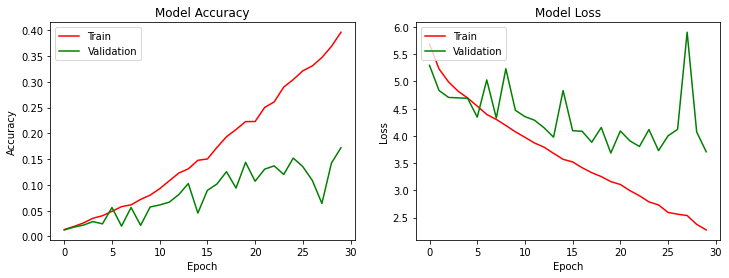

64/64 [==============================] - 11s 177ms/step - loss: 3.7095 - accuracy: 0.1722
Start FOLD Number 5
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 5.6906 - accuracy: 0.0141
Epoch 00001: val_accuracy improved from -inf to 0.01125, saving model to /content/drive/MyDrive/Data/Models/Model_5.h5
256/256 [==============================] - 67s 261ms/step - loss: 5.6906 - accuracy: 0.0141 - val_loss: 5.2340 - val_accuracy: 0.0113
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 5.2591 - accuracy: 0.0187
Epoch 00002: val_accuracy improved from 0.01125 to 0.02299, saving model to /content/drive/MyDrive/Data/Models/Model_5.h5
256/256 [==============================] - 68s 265ms/step - loss: 5.2591 - accuracy: 0.0187 - val_loss: 4.9036 - val_accuracy: 0.0230
Epoch 3/30
256/256 [==============================] - ETA: 0s -

<Figure size 432x288 with 0 Axes>

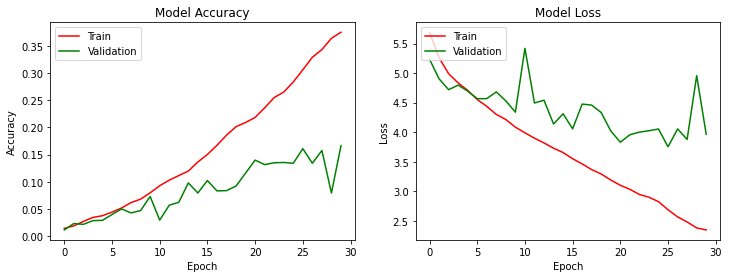

64/64 [==============================] - 12s 180ms/step - loss: 3.9642 - accuracy: 0.1663
3


KeyError: ignored

<Figure size 432x288 with 0 Axes>

In [ ]:
third_model = fit_model_5Fold(3,(300,300),False)



### Conclusion of third improvment:
According to the latest results, the model values increased and the model became more accurate and less overfit.

### Predictions Samples of the new model:

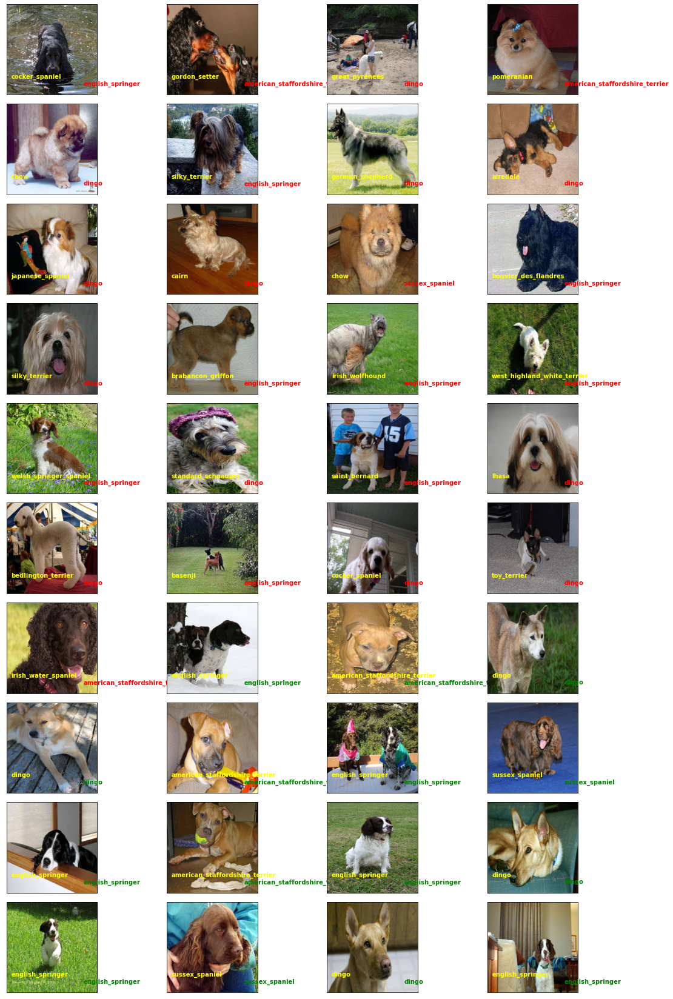

In [ ]:
lables_df = pd.read_csv("/content/drive/MyDrive/Data/labels.csv" , engine="python")
lables_df['id'] = lables_df['id'] + '.jpg'
lables_df.set_index('id' , inplace=True)

sub_lables_df = pd.read_csv(r'/content/drive/MyDrive/Data/sample_submission.csv' , engine="python")
lables = sub_lables_df.columns
test_dir = r'/content/drive/MyDrive/Data/test'
main_dir = r"/content/drive/MyDrive/Data"
sub_lables_df['id'] = sub_lables_df['id'] + '.jpg'

img_data_array = []
true_classes = []
pred_lables = []

dir_name = r'/content/drive/MyDrive/Data/train'

model = get_third_model()
model.load_weights(r'/content/drive/MyDrive/Data/Models/Model_3.h5')
num_true = 0
num_false = 0
for filename in os.listdir(dir_name):
    if num_true + num_false == 40:
        break
    else:
        image_path = os.path.join(dir_name , filename)
        image=load_img( image_path)
        pred = model.predict(np.expand_dims(np.array(image.resize((300,300))), axis=0))
        class_num = np.argmax(pred,axis=1)
        pred_lbl = lables[class_num][0]
        image=image.resize((400, 400))
        image=np.array(image)
        image=image.astype('float32')
        image /= 255 
        true_lbl = lables_df.loc[filename , 'breed']
        if true_lbl == pred_lbl:
            true_classes.append(true_lbl)
            img_data_array.append(image)
            pred_lables.append(pred_lbl)
            num_true += 1
        else:
            if num_false < 25:
                true_classes.append(true_lbl)
                img_data_array.append(image)
                pred_lables.append(pred_lbl)
                num_false += 1
    
    
Display_Images(img_data_array,true_classes,10,4,(30,30),pred_lables)



In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)
df=pd.DataFrame(sub_lables_df['id'])
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df,
    directory=test_dir,
    x_col="id",
    y_col=None,
    target_size=(300, 300),
    color_mode="rgb",
    batch_size=1,
    seed=20,
    class_mode=None,
    shuffle=False
)

pred=model.predict_generator(test_generator, steps=len(test_generator), verbose=1)
pred_df = pd.DataFrame(pred)

df = pd.DataFrame()
df['id'] = sub_lables_df['id']

columns_names = ['id']
for i in range(120):
    df[i+1] = pred_df[i]
    col_name = lables[i+1]
    columns_names.append(col_name)

df.columns = columns_names
print(df)

df.to_csv(main_dir+'/submission_model3.csv', index = False)

#### Result score from Kaggle:

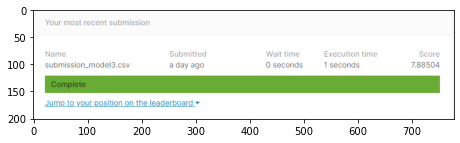

In [2]:
plt.figure(figsize = (20,2))
plt.imshow(mpimg.imread(r'C:\Users\shachar meretz\Desktop\pic.PNG'))

In addition to the two suggestions you applied, implement inference time augmentation and report the improvement in metrics you received.

We Will Change Input size to 100X100

To make the model fit for the new input dimensions, we will remove the last convolution layer with 2048 filters. We will do this to make the augmentation process more efficient and to generalize the images

Start FOLD Number 1
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_35 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization_35 (Batc (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d_31 (MaxPooling (None, 49, 49, 32)        0         
_________________________________________________________________
dropout_35 (Dropout)         (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_36 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
batch_normalization_36 (Batc (None, 47, 

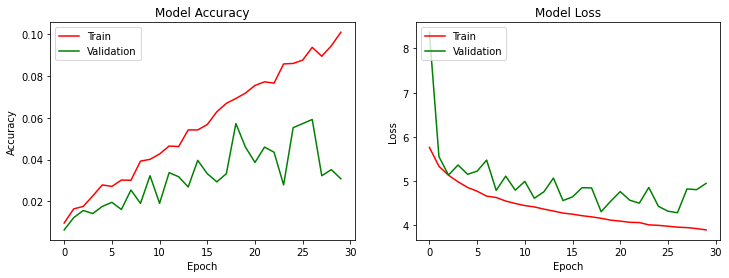

64/64 [==============================] - 12s 180ms/step - loss: 4.2963 - accuracy: 0.0606
Start FOLD Number 2
Found 8177 validated image filenames belonging to 120 classes.
Found 2045 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
__________________

<Figure size 432x288 with 0 Axes>

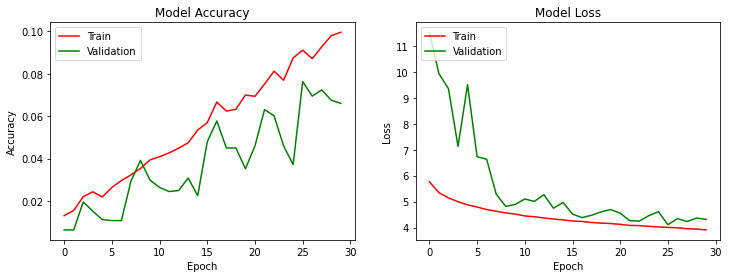

64/64 [==============================] - 11s 179ms/step - loss: 4.1149 - accuracy: 0.0802
Start FOLD Number 3
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
__________________

<Figure size 432x288 with 0 Axes>

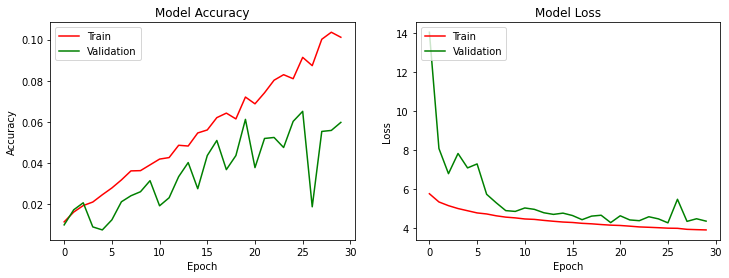

64/64 [==============================] - 11s 178ms/step - loss: 4.2650 - accuracy: 0.0626
Start FOLD Number 4
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
__________________

<Figure size 432x288 with 0 Axes>

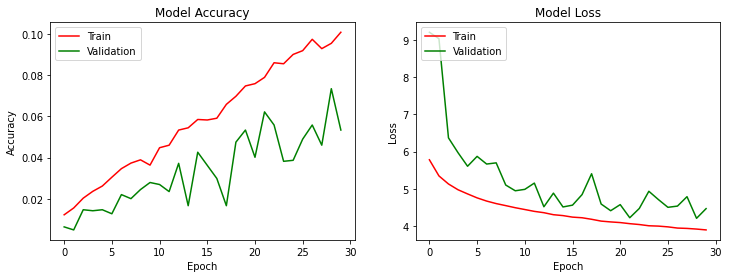

64/64 [==============================] - 11s 177ms/step - loss: 4.2139 - accuracy: 0.0709
Start FOLD Number 5
Found 8178 validated image filenames belonging to 120 classes.
Found 2044 validated image filenames belonging to 120 classes.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 98, 98, 32)        896       
_________________________________________________________________
batch_normalization (BatchNo (None, 98, 98, 32)        128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 49, 49, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 47, 47, 64)        18496     
__________________

<Figure size 432x288 with 0 Axes>

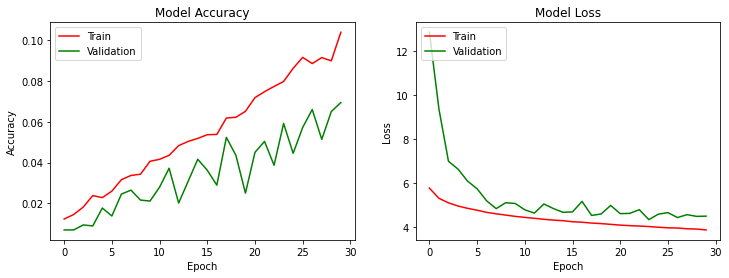

64/64 [==============================] - 12s 187ms/step - loss: 4.5184 - accuracy: 0.0705


<Figure size 432x288 with 0 Axes>

In [18]:
def get_model_for_augmentation():
    model = Sequential()

    model.add(Conv2D(32, (3, 3),activation='relu', input_shape=(100,100,3)))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(64, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(128, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(512, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Conv2D(1024, (3, 3),activation='relu'))
    model.add(BatchNormalization())
    model.add(MaxPool2D(pool_size=(2, 2)))
    model.add(Dropout(0.5))

    model.add(Flatten())
    model.add(Dense(1024, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(512, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(120, activation='softmax'))
    model.summary()
    return model

fit_model_5Fold(4,(100,100),True)


#### Conclusion of Augmantation model :

By the result we see that although in this model the accuracy values are lower but also the level of overfitting is significantly smaller.
We assume that during augmentation training it takes the model longer to learn and if we increase the amount of epochs for each fold (this can be done since there is no overfitting now) we will get higher accuracy values.

##### Summary of improvements that helped:
1.Adding convolution layers containing number of filters in ascending order (from 32 to 2048).

2.increase the drop-out value from 0.2 to 0.5.

3.reduce the dimensions of the input images to 300x300.

4.added a layer of Batch Normalization after each layer of convolution and after each layer of Dense.

5.added several Dense layers at the end of the model.

###### There are other ways that can improve the model that we have not yet considered:
1.reduce the dimensions of the input images less than 300x300.

2.change the MaxPool to GlobalPool

3.increase the amount of epochs for each fold 

#### compare these models:

In [6]:
first_model_input_size = "(375,375,3)"
second_model_input_size = "(300,300,3)"
third_model_input_size = "(300,300,3)"
forth_model_input_size = "(100,100,3)"


summariz_df = pd.DataFrame(columns=[ '' , 'Basic Model' , 'Improvement Model' , 'Final Model' , 'Augmantation Model'])
summariz_df[''] = ['Input Size' , 'Validation Accuracy' , 'Validation Loss']
summariz_df.set_index('' , inplace=True)

summariz_df.loc['Input Size' , 'Basic Model'] = first_model_input_size
summariz_df.loc['Validation Accuracy' , 'Basic Model'] = 0.0210
summariz_df.loc['Validation Loss' , 'Basic Model'] = 41.5699

summariz_df.loc['Input Size' , 'Improvement Model'] = second_model_input_size
summariz_df.loc['Validation Accuracy' , 'Improvement Model' ] =0.0313
summariz_df.loc['Validation Loss' , 'Improvement Model' ] = 5.3848

summariz_df.loc['Input Size' , 'Final Model'] = third_model_input_size
summariz_df.loc['Validation Accuracy' , 'Final Model'] = 0.1663
summariz_df.loc['Validation Loss' , 'Final Model'] = 3.9642

summariz_df.loc['Input Size' , 'Augmantation Model'] = forth_model_input_size
summariz_df.loc['Validation Accuracy' , 'Augmantation Model'] =0.0705
summariz_df.loc['Validation Loss' , 'Augmantation Model'] = 4.5184
summariz_df

,Basic Model,Improvement Model,Final Model,Augmantation Model
,,,,
Input Size,"(375,375,3)","(300,300,3)","(300,300,3)","(100,100,3)"
Validation Accuracy,0.021,0.0313,0.1663,0.0705
Validation Loss,41.5699,5.3848,3.9642,4.5184


# Select a Trained Model Architecture

### ***Create pre-trained model of Xception architecture:***

In [ ]:
def Get_Xception_Model_With_Last_Layer():
    xception = tf.keras.applications.Xception(
                                                    include_top=False,
                                                    weights='imagenet',
                                                    input_shape=(224,224,3),
                                                    pooling='max',
                                                  )
    x = Dense(120,activation='softmax',name = 'predictions_final')(xception.layers[-1].output)
    model = Model(inputs = xception.input,outputs = x)
    model.summary()
    return model

model = Get_Xception_Model_With_Last_Layer()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
_______________________________________________________________________________________

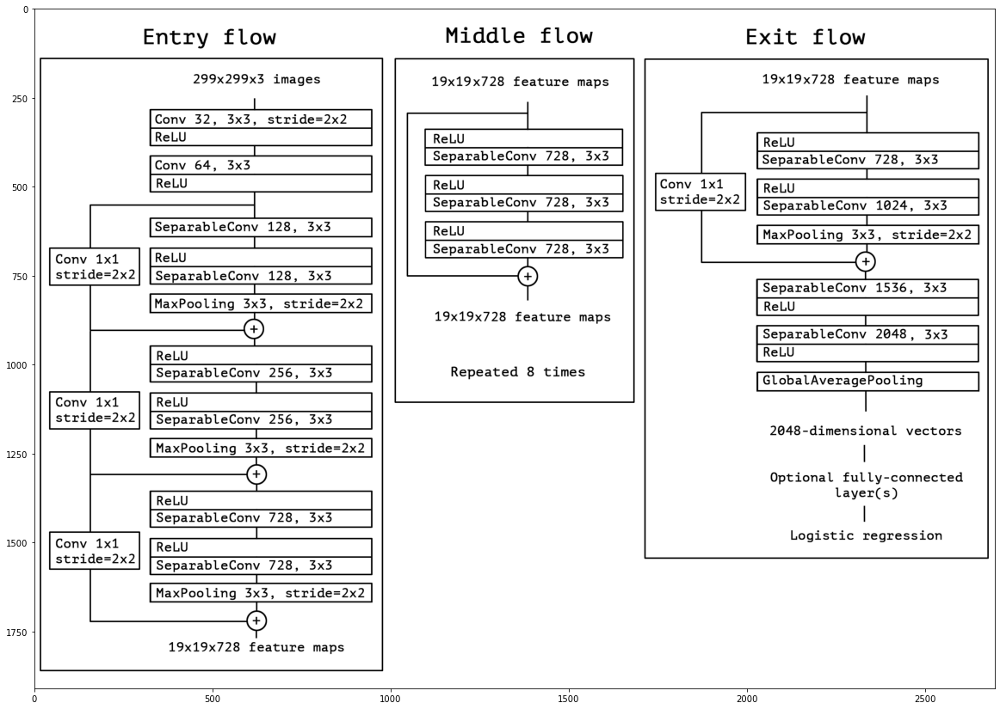

In [5]:
plt.figure(figsize = (20,40))
plt.imshow(mpimg.imread(r'C:\Users\shachar meretz\Desktop\xception_architecture_final.PNG'))

**fit Xception model:**

We split the training set into 5 parts , wich one part being a validation set of the training process


Found 8176 validated image filenames belonging to 120 classes.
Found 2046 validated image filenames belonging to 120 classes.
Epoch 1/30
256/256 [==============================] - ETA: 0s - loss: 3.0528 - accuracy: 0.2668
Epoch 00001: val_accuracy improved from -inf to 0.26491, saving model to /content/drive/MyDrive/Data/Xception300_3.h5
256/256 [==============================] - 792s 3s/step - loss: 3.0528 - accuracy: 0.2668 - val_loss: 4.8056 - val_accuracy: 0.2649
Epoch 2/30
256/256 [==============================] - ETA: 0s - loss: 1.4819 - accuracy: 0.5773
Epoch 00002: val_accuracy improved from 0.26491 to 0.42962, saving model to /content/drive/MyDrive/Data/Xception300_3.h5
256/256 [==============================] - 180s 702ms/step - loss: 1.4819 - accuracy: 0.5773 - val_loss: 2.1254 - val_accuracy: 0.4296
Epoch 3/30
256/256 [==============================] - ETA: 0s - loss: 0.9346 - accuracy: 0.7036
Epoch 00003: val_accuracy did not improve from 0.42962
256/256 [================

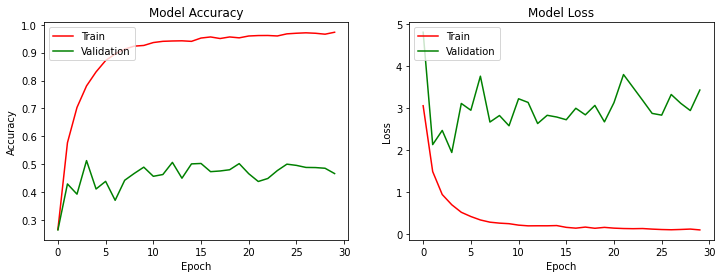

64/64 [==============================] - 12s 193ms/step - loss: 3.4269 - accuracy: 0.4668
Xceprion Fit Time : 5946.2579126949995
Xception Validation Accuracy : 0.4667644202709198
Xception Validation Loss: 3.4268548488616943


In [ ]:
import timeit

lables_df = pd.read_csv("/content/drive/MyDrive/Data/labels.csv" , engine="python")
main_dir = r"/content/drive/MyDrive/Data"
save_dir = r"/content/drive/MyDrive/Data" 
train_df = lables_df[['breed']]
train_df['id'] = lables_df['id'] + '.jpg'

split_index = int( len(train_df)/5 ) * 4


training_data = train_df.iloc[0:split_index]
validation_data = train_df.iloc[split_index:]
datagen = ImageDataGenerator() 

train_data_generator = datagen.flow_from_dataframe(training_data, directory=os.path.join(main_dir,'train'),
                                x_col = "id", y_col = "breed",
                                target_size=(224, 224),
                                color_mode="rgb", 
                                batch_size=32,
                                class_mode = "categorical", shuffle = True)
valid_data_generator = datagen.flow_from_dataframe(validation_data, directory=os.path.join(main_dir,'train'),
                               x_col = "id", y_col = "breed",
                                target_size=(224, 224),
                                color_mode="rgb", 
                                batch_size=32,
                               class_mode = "categorical", shuffle = True)

checkpoint = tf.keras.callbacks.ModelCheckpoint(os.path.join(save_dir,'Xception.h5'), monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

start = timeit.default_timer()
history_xc = model.fit(train_data_generator,epochs=30,callbacks=callbacks_list,validation_data=valid_data_generator)

stop = timeit.default_timer()

fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(history_xc.history['accuracy'] , color='red')
ax[0].plot(history_xc.history['val_accuracy'] , color='green')
ax[0].set_title('Model Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'], loc='upper left' )

ax[1].plot(history_xc.history['loss'] , color='red')
ax[1].plot(history_xc.history['val_loss'] , color='green')
ax[1].set_title('Model Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'], loc='upper left')
plt.show()

matrics = model.evaluate(valid_data_generator)
xc_val_loss = matrics[0]
xc_val_acc = matrics[1]
fit_time_xc = stop - start
print("Xceprion Fit Time : {}".format(fit_time_xc))
print("Xception Validation Accuracy : {}".format(xc_val_acc))
print("Xception Validation Loss: {}".format(xc_val_loss))

After we have performed a model training we will use it to make a prediction for the training set and the validation set so that we can perform a process of features extraction using another deep learning model

In [ ]:
def create_image_train_valid_data_sets(train_dir , lables_df):
    from tensorflow.keras.applications import imagenet_utils
    images_array = []
    lables_array = []
    for file_name in os.listdir(train_dir):
        lable = lables_df.loc[file_name , 'breed']
        image_path = os.path.join(train_dir , file_name)
        image = load_img(image_path , target_size=(224, 224))
        image = img_to_array(image)
        new_image = np.expand_dims(image, axis=0)
        new_image = imagenet_utils.preprocess_input(new_image)
        images_array.append(new_image)
        lables_array.append(lable)
        
    images_array = np.vstack(images_array)    
    split = int(len(images_array)/5 * 4)
    train = images_array[:split]
    train_lbl = lables_array[:split]
    validation = images_array[split:]
    validation_lbl = lables_array[split:]
    print("Train set size : {}\nValidation set size : {}".format(len(train) , len(validation)))
    
    return train,train_lbl,validation,validation_lbl



In [ ]:
train_dir = r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\train\train'
lables_df = pd.read_csv(r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\train\labels.csv' , engine="python")
lables_df['id'] = lables_df['id'] + '.jpg'
lables_df.set_index('id',inplace=True)

train , train_lbls , validation , validation_lbls = create_image_train_valid_data_sets(train_dir,lables_df)

Train set size : 8177
Validation set size : 2045


In [ ]:
print(train.shape)
print(np.array(train_lbls).shape)
print(validation.shape)
print(np.array(validation_lbls).shape)

(8177, 224, 224, 3)
(8177,)
(2045, 224, 224, 3)
(2045,)


In [ ]:
import timeit

model.load_weights(r'C:\Users\ibitton\OneDrive - Intel Corporation\Desktop\Year 4\Deep Learning\Ass1\Data\Xception.h5')
model_new = Model(model.input, model.layers[-2].output)
model_new.summary()
start = timeit.default_timer()
print("Start predict train")
predictions_train = model_new.predict(train , batch_size=32)

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
block1_conv1_bn (BatchNormaliza (None, 111, 111, 32) 128         block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_conv1_act (Activation)   (None, 111, 111, 32) 0           block1_conv1_bn[0][0]            
_______________________________________________________________________________________

In [ ]:
print("Start predict Validation")
start = timeit.default_timer()
predictions_validation = model_new.predict(validation , batch_size=32)
stop = timeit.default_timer()
predict_time_xc = stop - start
print("Xceprion Predict Time : {}".format(predict_time_xc))

Start predict Validation
Xceprion Predict Time : 203.91974259999984


**For features extraction we decided to use SVM Model and Logistic Regression:**

We trained the SVM Model and Logistic Regression on the predication of the training set we get from Xception model - matrix with the size of (number of images X 2048)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

lrc = LogisticRegression(n_jobs=8,solver='lbfgs',multi_class='auto')
svm = SVC(max_iter=8000,gamma='auto')
start = timeit.default_timer()
lrc.fit(predictions_train , np.array(train_lbls))
stop = timeit.default_timer()
fit_time_lrc = stop - start
start = timeit.default_timer()
svm.fit(predictions_train , np.array(train_lbls))
stop = timeit.default_timer()
fit_time_svm = stop - start
print("LRC Model Fit Time : {}".format(fit_time_lrc))
print("SVM Model Fit Time : {}".format(fit_time_svm))

LRC Model Fit Time : 58.63662929999987
SVM Model Fit Time : 200.5441163999999


After the training we will measure the Accuracy on the predication of the validation set that we get from Xception model - matrix with the size of (number of images X 2048)

In [ ]:
import seaborn as sns
from sklearn import metrics
start = timeit.default_timer()
predictions_lrc = lrc.predict(predictions_validation)
stop = timeit.default_timer()
predict_time_lrc = stop - start
start = timeit.default_timer()
predictions_svm = svm.predict(predictions_validation)
stop = timeit.default_timer()
predict_time_svm = stop - start

print("LRC Model Predict Time : {}".format(predict_time_lrc))
print("SVM Model Predict Time : {}".format(predict_time_svm))

lrc_val_acc = metrics.accuracy_score(validation_lbls,predictions_lrc)
svm_val_acc = metrics.accuracy_score(validation_lbls,predictions_svm)
print("LRC Model Validation Accuracy: {}".format(lrc_val_acc))
print("SVM Model Validation Accuracy: {}".format(svm_val_acc))




LRC Model Predict Time : 0.043863599999895087
SVM Model Predict Time : 47.10599140000022
LRC Model Validation Accuracy: 0.36332518337408315
SVM Model Validation Accuracy: 0.258679706601467


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(validation_lbls,predictions_svm)


array([[ 8,  0,  0, ...,  0,  0,  0],
       [ 0, 12,  0, ...,  1,  0,  0],
       [ 0,  0,  6, ...,  1,  0,  0],
       ...,
       [ 0,  0,  0, ...,  2,  0,  0],
       [ 0,  0,  0, ...,  0,  2,  0],
       [ 2,  0,  0, ...,  0,  0,  2]], dtype=int64)

In [ ]:
confusion_matrix(validation_lbls,predictions_lrc)

array([[ 3,  0,  0, ...,  0,  0,  3],
       [ 0, 11,  0, ...,  0,  0,  0],
       [ 1,  0,  9, ...,  1,  0,  0],
       ...,
       [ 0,  0,  1, ...,  3,  0,  0],
       [ 0,  0,  0, ...,  0,  8,  0],
       [ 0,  0,  0, ...,  0,  0,  5]], dtype=int64)

Now we will compare these two models

In [19]:
xception_input_size = "(224,224,3)"
svm_input_size = "(1,2048)"
lrc_input_size = "(1,2048)"


summariz_df = pd.DataFrame(columns=[ '' , 'Xception Model' , 'SVM Model' , 'LRC Model'])
summariz_df[''] = ['Fit Time Sec' , 'Prediction Time Sec' , 'Input Size' , 'Validation Accuracy']
summariz_df.set_index('' , inplace=True)

summariz_df.loc['Fit Time Sec' , 'Xception Model'] = 5946.257
summariz_df.loc['Prediction Time Sec' , 'Xception Model'] = 203.919 
summariz_df.loc['Input Size' , 'Xception Model'] = xception_input_size
summariz_df.loc['Validation Accuracy' , 'Xception Model'] = 0.466

summariz_df.loc['Fit Time Sec' , 'SVM Model'] = 200.544
summariz_df.loc['Prediction Time Sec' , 'SVM Model'] = 47.105
summariz_df.loc['Input Size' , 'SVM Model'] = svm_input_size
summariz_df.loc['Validation Accuracy' , 'SVM Model'] = 0.258

summariz_df.loc['Fit Time Sec' , 'LRC Model'] = 58.636
summariz_df.loc['Prediction Time Sec' , 'LRC Model'] = 0.043
summariz_df.loc['Input Size' , 'LRC Model'] = lrc_input_size
summariz_df.loc['Validation Accuracy' , 'LRC Model'] = 0.363

summariz_df

,Xception Model,SVM Model,LRC Model
,,,
Fit Time Sec,5946.26,200.544,58.636
Prediction Time Sec,203.919,47.105,0.043
Input Size,"(224,224,3)","(1,2048)","(1,2048)"
Validation Accuracy,0.466,0.258,0.363


In this comparison it can be seen that with a trained Xception model we will reach higher validation accuracy but compared to linear regression we got a lower accuracy value but in a ratio of 10 percent in less training time and prediction time

In [ ]:
def save_model(model,filename):
    # this is a helper function used to save a keras NN model architecture and weights
    json_string = model.to_json()
    if not os.path.isdir('cache'):
        os.mkdir('cache')
    open(save_dir+"text11.json", 'w').write(json_string)
    model.save_weights(save_dir+"weight11.h5", overwrite=True)

save_model(first_model,"first")

# Project Conclusion:

In this project we did multi-class image classification with dog breed dataset. This is the first time we have tried to deal with such a big dataset , neural networks and deep learning models in general. 
Before we started trying to build a nueral network model we did data anlysis on the dataset we got. We saw that we have a relatively small amount of pictures for each dog breed and a large amount of different dog breeds so we concluded that the learning will be long.
The first model we built was the basic model containing a small number of layers. We wanted to see the performance of the model, and whether it learns specifically for the training photos. We kept the simplicity of the model so that we did not use augmentation and a lot of convolution layers.
In the results of the model we saw that within a small number of moves the model comes to overfiting so we realized that we need to simplify the model. The way we chose to simplify the model was to add convolution layers, add BatchNormalization layers and increase the Dropout value.
Finally we ran a model that augments the images. After analyzing the results of this model, we saw that although the model takes longer to reach high accuracy values, it performs controlled and slow learning in both the training data and the validation data. We assume according to the progress of the values in all epochs that if we perform this model on a higher number of epochs we would get higher accuracy values.

In those 3 models, the amount of layers was already large and the model was more deep than the basic. These models were challenging because they took a longer run time and as a result the run take long time and code crashes. We worked on Google Colab and used GPU, and sometimes tried to run the notebook by anaconda on our computers.
if we were not limited in terms of space and running time we would increase the running time to a larger amount of epochs and create a model with more layers so that it has more depth.
In the second part we had to choose a trained model from those presented in the lectures as well as other models we found online, and we chose the Xception model to perform this part.
For this model, we removed the last layer and added another layer that fits the trained model to our classification problem. We used trained weights from ImageNet and adjusted the image size to the input size of the trained model we chose.We trained the model on our dataset and divided the dataset so that 80% of it became the training data while 20% of it became the test data.
During the analysis of the results we saw that this model receives much higher values than the models we performed in Part A. It can be understood that the depth and complexity of the model helps it to perform better learning.

After we performed a feature extractor on the trained model. To do this we removed the last layer and used the output we got from the model (output size 2048 features).
During the analysis of the data we saw that the amount of features coming out of this model is relatively small compared to other models online and therefore we concluded that during the execution of the feature extractor we will get relatively low values. In addition, we assumed that if we performed a feature extractor on a larger amount of features the model accuracy results would be higher.
After extracting the features we wanted to train the model on our dataset to check if feature extractor can be effective. We chose to use 2 models to perform the predict - SVM and Logistics regression. We tested their accuracy values and compared their accuracy values with the accuracy values of the original trained model.
We have seen that although the accuracy values are lower but the time it takes to execute is faster and therefore the situation is tradeoff between time and accuracy.

In conclusion, this work was challenging , we learned a lot, and we felt we got the tools and understanding that need for starting with machine learning.

